# OCR - From images to text

In this notebook, we're going to see how we can extract text from images using the ```pytesseract``` library. However, we're going to touch on a lot of different skills we've learned this semester - including drawing on ideas from Language Analytics, too!

In [37]:
# run the setup_ses11.sh

# basic python tools
import re, os, sys
sys.path.append("..")

# OCR tools
import cv2
import pytesseract

# util functions
from utils.imutils import jimshow as show
from utils.imutils import jimshow_channel as show_channel

# data processing tools
import numpy as np 
import pandas as pd 

# readymade spellchecker
from autocorrect import Speller

def clean_string(string):
    """Removes punctuation to assist in OCR correction"""
    processed = string.replace("\n"," ")\
                     .replace("\n\n"," ")\
                     .replace("__"," ")\
                     .replace(" - "," ")\
                     .replace('-""' ," ")\
                     .replace("|", "")\
                     .replace("!", "")\
                     .replace("\s\s"," ")\
                     .lstrip()
    return " ".join(processed.split())

## OCR using ```Tesseract```

Tesseract/pytesseract is quite a rich library with lots of different functionality and small tweaks and tricks that can improve your OCR. Check out the documentation for more info:

**Pytesseract:** [Github](https://github.com/h/pytesseract) <br><br>
**Tesseract:** [Github](https://github.com/tesseract-ocr/tesseract); [Documentation](https://tesseract-ocr.github.io/)

In [50]:
filepath = os.path.join("..", 
                        "..",
                        "..",
                        "cds-vis-data",
                        "data", 
                        "img", 
                        "jefferson.jpg")


The simplest way of using ```pytesseract``` is simply to call the ```.image_to_string()```. As the name suggests, this produces a single string with all of the text content found in the image:

In [ ]:
text = pytesseract.image_to_string(filepath)
print(text)

The library also has a method for returning the information as a dataframe which contains a detailed collection of information about its predictions:

In [52]:
df = pytesseract.image_to_data(filepath, 
                               output_type = 'data.frame')

In [53]:
df

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,1,1,0,0,0,0,0,0,4320,3240,-1,NaN
1,2,1,1,0,0,0,0,0,4320,1276,-1,NaN
2,3,1,1,1,0,0,0,0,4320,1276,-1,NaN
3,4,1,1,1,1,0,0,0,4320,1276,-1,NaN
4,5,1,1,1,1,1,0,0,4320,1276,95,
...,...,...,...,...,...,...,...,...,...,...,...,...
128,2,1,16,0,0,0,1775,3176,717,64,-1,NaN
129,3,1,16,1,0,0,1775,3176,717,64,-1,NaN
130,4,1,16,1,1,0,1775,3176,717,64,-1,NaN
131,5,1,16,1,1,1,1775,3176,49,64,95,


## Preprocess with Open-CV

Note that Tesseract on Github give a bunch of tips for how best to preprocess images to improve performance. 

You should have the skills to actually do all of these things using OpenCV: https://github.com/tesseract-ocr/tessdoc/blob/main/ImproveQuality.md#rescaling

In [54]:
image = cv2.imread(filepath)

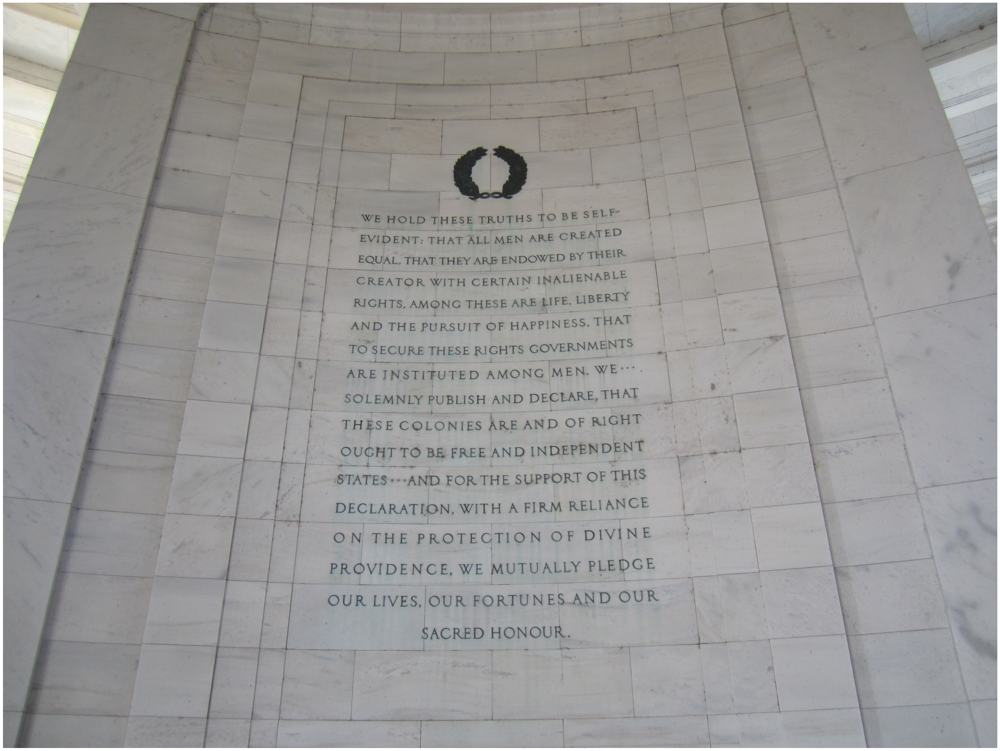

In [55]:
show(image)

__Crop__

The first thing we want to do is to crop this around the center of the image to keep only the main text.

In [56]:
(cX, cY) = (image.shape[1]//2, image.shape[0]//2)
cropped = image[cY-750:cY+1150, cX-750:cX+700]

In [57]:
cropped

array([[[138, 144, 149],
        [138, 144, 149],
        [138, 144, 149],
        ...,
        [148, 155, 158],
        [150, 157, 160],
        [153, 160, 163]],

       [[139, 145, 150],
        [140, 146, 151],
        [137, 143, 148],
        ...,
        [148, 155, 158],
        [149, 156, 159],
        [153, 160, 163]],

       [[139, 144, 147],
        [141, 146, 149],
        [141, 146, 149],
        ...,
        [153, 160, 163],
        [152, 159, 162],
        [151, 158, 161]],

       ...,

       [[170, 162, 155],
        [166, 158, 151],
        [171, 163, 156],
        ...,
        [169, 167, 166],
        [168, 166, 165],
        [169, 167, 166]],

       [[171, 161, 154],
        [169, 159, 152],
        [170, 160, 153],
        ...,
        [170, 169, 165],
        [170, 169, 165],
        [169, 168, 164]],

       [[170, 160, 153],
        [170, 160, 153],
        [170, 160, 153],
        ...,
        [168, 167, 163],
        [169, 168, 164],
        [168, 167, 163]]

__Greyscale__

Next, we greyscale the image to attempt to remove extra noise.

In [58]:
grey = cv2.cvtColor(cropped, cv2.COLOR_BGR2GRAY)

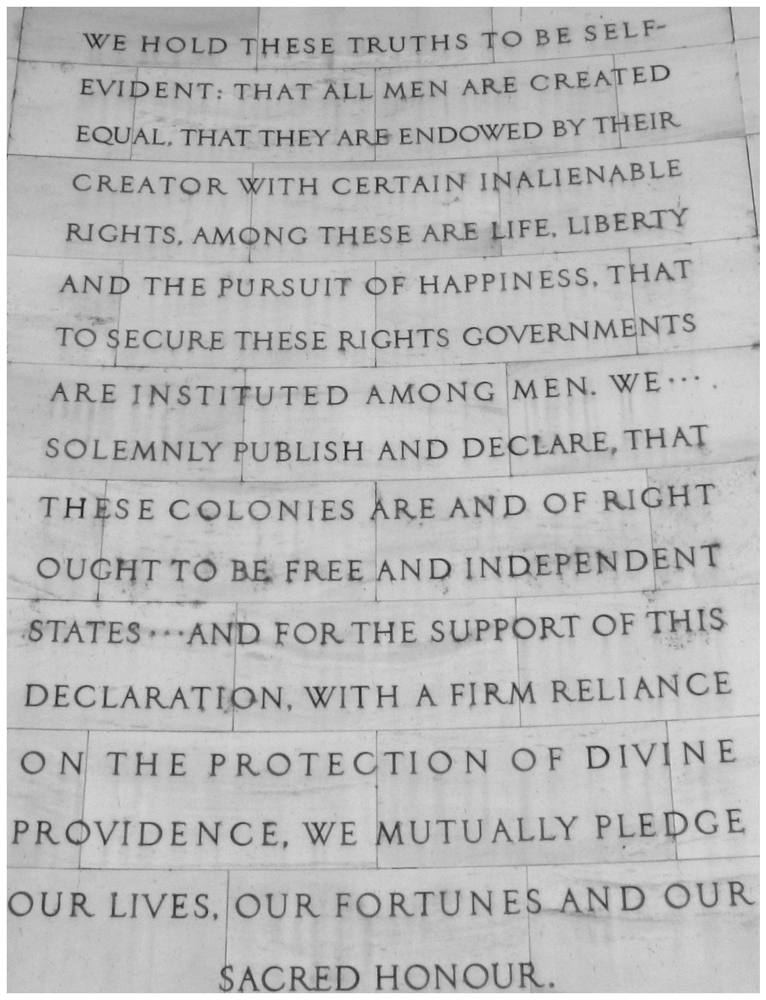

In [59]:
show_channel(grey)

__OCR again__

Let's see how these simple steps improve performance of the OCR model.

In [60]:
text = pytesseract.image_to_string(grey)

In [61]:
print(text)

ee tt

STATES

WE WE HOLD THESE 7 meyyys To BE SELF
EVIDENT: THAT ALL MEN ‘ARE CREATED
EIR

EQUAL, THAT THEY -ARB El ENDOWED BY TH :
CREATOR WITH CERTAIN INALIENABLE |

RIGHTS, AMONG THESE ARE LIFE. | LIBERTY
AND THE PURSUIT OF HAPPINESS: THAT

TO SECURE THESE RIGHTS GOVERNMENTS
ARE E INSTITUTED | AMONG |MEN. WE:
SOLEMNLY PUBLISH AND DECLARE, THAT
THESE COLONIES ARE. AND OF RIGHT
OUGHT TO BE FREE AND INDEPEN DENT
TES AND FOR THE SUPPORT OF THIS
DECLARATION, WITH A FIRM RELIANCE
O N THE ‘PROTECTION OF DIVINE
PROVIDE NCE, WE MUTUALLY PLEDGE

OUR LIVES, OUR FORTUNES.AND OUR
bACRED HONOUR.



__Thresholding__

Way back when we worked more with OpenCV, we learned that we could also *binarize* images using thresholding to make everything black or white (like when we created *masks*).

In [62]:
# threshold
(T, thres) = cv2.threshold(grey, 110, 255, cv2.THRESH_BINARY)

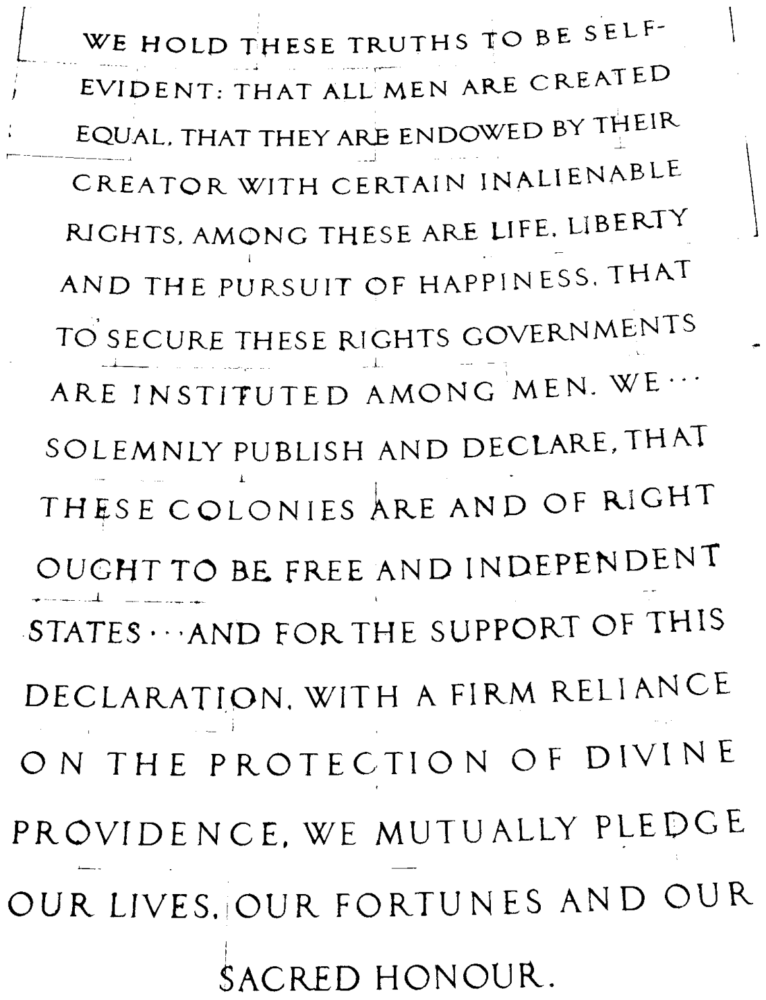

In [63]:
show_channel(thres)

In [64]:
text = pytesseract.image_to_string(thres)

In [65]:
print(text)

!

__ WE HOLD THESE TRUTHS TO BE SELF
EVIDENT: THAT ALL MEN ARE CREATED
- EQUAL. THAT THEY ARE ENDOWED BY THEIR
CREATOR WITH CERTAIN INALIENABLE |
RIGHTS, AMONG THESE ARE LIFE. LIBERTY
AND THE PURSUIT OF HAPPINESS. THAT
TO SECURE THESE RI IGHTS GOVERNMENT
ARE INSTIFUTED AMONG MEN. WE-""
SOLEMNLY PUBLISH AND DECLARE THAT
THESE COLONIES ARE AND OF RIGHT
OUGHT TO BE FREE AND INDEPENDENT
STATES AND FOR THE SUPPORT OF THIS
DECLARATION. WITH A FIRM RELIANCE
ON THE PROTECTION O F DIVINE
PROVIDENCE, WE MUTUALLY PLEDGE
OUR LIVES. OUR FORTUNES AND OUR

SACRED HONOUR.



## Quick and cheap spell checking

One of the main issues we seem to see is single-character errors which give misspelled words. So, let's see how far we can get by doing some simple spell checking and correction with the ```autocorrect``` library:

__Initialize speller__

In [66]:
spell = Speller(only_replacements = True)

In [67]:
cleaned = clean_string(text)

In [68]:
spell(cleaned.lower())

'we hold these truths to be self evident: that all men are created equal. that they are endowed by their creator with certain inalienable rights, among these are life. liberty and the pursuit of happiness. that to secure these ri ights government are instituted among men. we solemnly publish and declare that these colonies are and of right ought to be free and independent states and for the support of this declaration. with a firm reliance on the protection o f divine providence, we mutually pledge our lives. our fortunes and our sacred honour.'

## Tasks

__Spell checking with generative LLMs__
- Head over to HuggingChat and check out some of the newest LLMs perform on this task. Test all of the available models and ask the following questions

__Some test images__

- I've attached some links to culturally significant images below. How well does the OCR pipeline work on these images? What do you need to do to get it to work? What does this suggest about the challenges or limitations of OCR?
    - [Image 1](https://www.techsmith.com/blog/wp-content/uploads/2021/09/Make-a-meme-butterfly.png)
    - [Image 2](https://datasciencedojo.com/wp-content/uploads/52.jpg)
    - [Image 3](https://datasciencedojo.com/wp-content/uploads/36.png)
    - [Image 4 (an actually serious example)](https://upload.wikimedia.org/wikipedia/commons/7/7e/King_James_Bible-Isaiah_26.jpg)
    - [Image 5](https://imgs.xkcd.com/comics/git.png)

#### OCR on image 5 (meme5.pgn)

In [76]:
# no preprocessing
meme5_text = pytesseract.image_to_string("data/meme5.png")
print(meme5_text)

 

 

THIS GIT. IT TRACKS COLLABORATIVE WORK
ON PROJECTS THROUGH A BEAUTIFUL.
DISTRIBUTED GRAPH THEORY TREE. MODEL.

COOL. HOU DO WE.USE. IT?

NO IDEA. JUST MEMORIZE. THESE SHELL
COMMANDS AND TYPE. THEM To SYNC UP
IF YOU GET ERRORS, SAVE YOUR WORK
ELSEWHERE, DELETE THE PROJECT,
AND DOWNLOAD A FRESH COPY.

\

Saft

 

 

 

 

 

 

 



In [77]:
# using cv2
meme5 = cv2.imread("data/meme5.png")

In [104]:
# crop 
(cX, cY) = (meme5.shape[1]//2, meme5.shape[0]//2) # define the center of the image (cX = 165, cY = 239)
meme5_cropped = meme5[cY-225:cY-10, cX-150:cX+150]

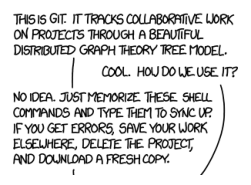

In [105]:
show(meme5_cropped)

In [106]:
# greyscale image
meme5_grey = cv2.cvtColor(meme5_cropped, cv2.COLOR_BGR2GRAY)

In [108]:
# check if the cropped and greyscaled image improved performance
meme5_text = pytesseract.image_to_string(meme5_grey)
print(meme5_text)

THIS GIT. IT TRACKS COLLABORATIVE WORK
ON PROJECTS THROUGH A BEAUTIFUL.
DISTRIBUTED GRAPH THEORY TREE. MODEL.

COOL. HOU DO WE.USE. IT?

NO IDEA. JUST MEMORIZE. THESE SHELL
COMMANDS AND TYPE. THEM To SYNC UP
IF YOU GET ERRORS, SAVE YOUR WORK



In [109]:
# threholding
(T, meme5_thres) = cv2.threshold(meme5_grey, 100, 255, cv2.THRESH_BINARY) # inverted to black text on white background
meme5_text_thres = pytesseract.image_to_string(meme5_thres)
print(meme5_text_thres)

THIS IS GIT. IT TRACKS COLLABORATIVE ORK
ON PROJECTS THROUGH A BEAUTIFUL,
DISTRIBUTED GRAPH THEORY TREE MODEL.

COOL. HOU DO WE. USE IT?

NO IDEA. JUST MEMORIZE. THESE. SHELL
COMMANDS AND TYPE THEM To SYNC UP
IF You GET ERRORS, SAVE YOUR WORK
ELSEWHERE, DELETE THE. PROJECT
AND DOWNLOAD A FRESH COPY.

,

